Exploratory Data Analysis of the Body Performance Dataset

EDA is a crucial stage in the data science workflow because it allows patterns, relationships and potential issues with a dataset to be identified before any predictive modelling is attempted.

Why was the body performance dataset selected?
The body performance dataset was selected because it contains tabular data, a large number of observations and multiple numerical variables suitable for statistical analysis and dimensionality reduction. The dataset contains physical measurements and exercise performance indicators for individuals, including age, height, weight, body fat percentage, grip strength, sit-up counts and broad jump distance. In addition, each individual is assigned a performance class ranging from A to D. These variables make the dataset particularly suitable for investigating how physical characteristics relate to athletic performance.

In [1]:
import plotly.io as pio

pio.renderers.default = "notebook"

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import plotly.express as px

from pandas.plotting import scatter_matrix

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import warnings
warnings.filterwarnings("ignore")


Loading the Dataset.

The dataset was loaded using Pandas, which provides efficient tools for tabular data manipulation and exploration. Initial inspection using functions such as head(), tail(), info() and dtypes was performed to understand the structure of the dataset before carrying out any statistical analysis.
Understanding the dimensions and data types of the data set is important because it helps identify:
1)Which variables are numerical and suitable for quantitative analysis
2)Which variables are categorical
3)Whether preprocessing or encoding is required
4)Whether there are any obvious data quality issues



In [3]:
df = pd.read_csv("bodyPerformance.csv")
df.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,M,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B


In [4]:
df.tail()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
13388,25.0,M,172.1,71.8,16.2,74.0,141.0,35.8,17.4,47.0,198.0,C
13389,21.0,M,179.7,63.9,12.1,74.0,128.0,33.0,1.1,48.0,167.0,D
13390,39.0,M,177.2,80.5,20.1,78.0,132.0,63.5,16.4,45.0,229.0,A
13391,64.0,F,146.1,57.7,40.4,68.0,121.0,19.3,9.2,0.0,75.0,D
13392,34.0,M,164.0,66.1,19.5,82.0,150.0,35.9,7.1,51.0,180.0,C


Dataset overview.

The dataset contains more than 13,000 observations and multiple numerical variables describing both body composition and physical performance. Variables such as height, weight and body fat percentage describe the physical characteristics of individuals, while variables such as grip strength, sit-up counts and broad jump distance measure physical capability and fitness.

The dataset also contains categorical variables including gender and performance class. The performance class variable is particularly useful because it provides a natural grouping that can later be compared against the patterns identified by PCA and clustering. 

The relatively large number of observations makes the dataset suitable for identifying broader trends rather than isolated individual cases.

In [5]:
#Shape of dataset
print("Dataset Shape:")
print(df.shape)


Dataset Shape:
(13393, 12)


In [6]:
#Column Names
print("Columns in Dataset:\n")
for col in df.columns:
    print(col)

Columns in Dataset:

age
gender
height_cm
weight_kg
body fat_%
diastolic
systolic
gripForce
sit and bend forward_cm
sit-ups counts
broad jump_cm
class


In [7]:
#Dataset Information
df.info() #provides a concise summary of the dataset including column names,
          #non-null counts and data types, helping identify whether preprocessing 
          #or encoding will be required later in the analysis

<class 'pandas.DataFrame'>
RangeIndex: 13393 entries, 0 to 13392
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      13393 non-null  float64
 1   gender                   13393 non-null  str    
 2   height_cm                13393 non-null  float64
 3   weight_kg                13393 non-null  float64
 4   body fat_%               13393 non-null  float64
 5   diastolic                13393 non-null  float64
 6   systolic                 13393 non-null  float64
 7   gripForce                13393 non-null  float64
 8   sit and bend forward_cm  13393 non-null  float64
 9   sit-ups counts           13393 non-null  float64
 10  broad jump_cm            13393 non-null  float64
 11  class                    13393 non-null  str    
dtypes: float64(10), str(2)
memory usage: 1.2 MB


In [8]:
#Checking data types
df.dtypes #Inspecting data types is important because numerical and categorical
          #variables require different analytical approaches and preprocessing steps

age                        float64
gender                         str
height_cm                  float64
weight_kg                  float64
body fat_%                 float64
diastolic                  float64
systolic                   float64
gripForce                  float64
sit and bend forward_cm    float64
sit-ups counts             float64
broad jump_cm              float64
class                          str
dtype: object

Data cleaning and processing.

Before carrying out statistical analysis, the dataset was checked for missing values and duplicate observations.

Missing values can distort statistical calculations and visualisations, particularly in methods such as PCA and clustering which rely heavily on numerical consistency across observations. The analysis showed that the dataset contained no missing values, meaning that no imputation techniques were required.

Duplicate observations were also investigated because repeated rows may bias statistical summaries and artificially strengthen patterns within the data. Duplicate rows were removed where necessary to ensure the integrity of the analysis.

Categorical variables such as gender and class were inspected separately in order to understand the distribution of observations across categories.

In [9]:
#checking missing values
df.isnull().sum() #Missing values can distort statistical calculations and affect methods
                  #such as PCA and clustering, so the dataset is checked for completeness first

age                        0
gender                     0
height_cm                  0
weight_kg                  0
body fat_%                 0
diastolic                  0
systolic                   0
gripForce                  0
sit and bend forward_cm    0
sit-ups counts             0
broad jump_cm              0
class                      0
dtype: int64

In [10]:
#Checking duplicate rows
print("Number of duplicate rows:", df.duplicated().sum()) #Duplicate observations may artificially strengthen patterns within the data
                                                          #so they are identified before carrying out analysis

Number of duplicate rows: 1


In [11]:
#Removing duplicates
df = df.drop_duplicates() #Removing duplicate rows helps ensure that statistical summaries and
print("New dataset shape:", df.shape) #visualisations reflect genuine observations rather than repeated entries

New dataset shape: (13392, 12)


In [12]:
#Checking if unique values in categorical columns
categorical_columns = df.select_dtypes(include='object').columns
for col in categorical_columns:
    print(f"\n{col}")
    print(df[col].value_counts())


gender
gender
M    8467
F    4925
Name: count, dtype: int64

class
class
C    3349
D    3349
A    3347
B    3347
Name: count, dtype: int64


Descriptive Statistics

Descriptive statistics provide a summary of the central tendency and spread of the numerical variables within the dataset.

Measures such as the mean and median help identify the typical values for each feature, while variance and standard deviation describe how widely the observations are spread. Variables with high variance indicate greater diversity within the population.

Skewness was also calculated to investigate whether variables follow symmetric distributions or contain long tails. Positive skewness suggests that a small number of unusually high values exist, while negative skewness indicates the opposite.

These statistical summaries provide important context before visualisation and dimensionality reduction are performed.

Key observations from the descriptive statistics include:
1)Performance related variables such as broad jump distance and sit-up counts show substantial variation across individuals
2)Body fat percentage demonstrates noticeable spread, suggesting significant differences in body composition
3)Several variables display skewed distributions, motivating further investigation through visualisation and outlier analysis

In [13]:
#Statistical Summary
df.describe()

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
count,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000,13392.000000
mean,36.775836,168.560671,67.448686,23.239608,78.797499,130.238120,36.964569,15.208933,39.770385,190.131355
std,13.625886,8.426305,11.949061,7.256829,10.742165,14.709536,10.624959,8.456904,14.276902,39.868988
min,21.000000,125.000000,26.300000,3.000000,0.000000,0.000000,0.000000,-25.000000,0.000000,0.000000
25%,25.000000,162.400000,58.200000,18.000000,71.000000,120.000000,27.500000,10.900000,30.000000,162.000000
50%,32.000000,169.200000,67.400000,22.800000,79.000000,130.000000,37.900000,16.200000,41.000000,193.000000
75%,48.000000,174.800000,75.300000,28.000000,86.000000,141.000000,45.200000,20.700000,50.000000,221.000000
max,64.000000,193.800000,138.100000,78.400000,156.200000,201.000000,70.500000,213.000000,80.000000,303.000000


In [14]:
df.describe(include="object")

,gender,class
count,13392,13392
unique,2,4
top,M,C
freq,8467,3349


In [15]:
#Selecting numerical columns
numerical_columns = df.select_dtypes(include=np.number).columns
numerical_columns

Index(['age', 'height_cm', 'weight_kg', 'body fat_%', 'diastolic', 'systolic',
       'gripForce', 'sit and bend forward_cm', 'sit-ups counts',
       'broad jump_cm'],
      dtype='str')

In [16]:
#Mean values
df[numerical_columns].mean()

age                         36.775836
height_cm                  168.560671
weight_kg                   67.448686
body fat_%                  23.239608
diastolic                   78.797499
systolic                   130.238120
gripForce                   36.964569
sit and bend forward_cm     15.208933
sit-ups counts              39.770385
broad jump_cm              190.131355
dtype: float64

In [17]:
#Median values
df[numerical_columns].median()

age                         32.0
height_cm                  169.2
weight_kg                   67.4
body fat_%                  22.8
diastolic                   79.0
systolic                   130.0
gripForce                   37.9
sit and bend forward_cm     16.2
sit-ups counts              41.0
broad jump_cm              193.0
dtype: float64

In [18]:
#Variance
df[numerical_columns].var() #Variance quantifies how widely observations are spread around the mean
                            #providing insight into the diversity of physical performance measures

age                         185.664779
height_cm                    71.002616
weight_kg                   142.780049
body fat_%                   52.661563
diastolic                   115.394113
systolic                    216.370463
gripForce                   112.889757
sit and bend forward_cm      71.519220
sit-ups counts              203.829920
broad jump_cm              1589.536177
dtype: float64

In [19]:
#Standard deviation
df[numerical_columns].std()

age                        13.625886
height_cm                   8.426305
weight_kg                  11.949061
body fat_%                  7.256829
diastolic                  10.742165
systolic                   14.709536
gripForce                  10.624959
sit and bend forward_cm     8.456904
sit-ups counts             14.276902
broad jump_cm              39.868988
dtype: float64

In [20]:
#Skewness 
df[numerical_columns].skew() #Skewness measures the asymmetry of distributions and helps identify
                             #variables that may contain long tails or extreme observations

age                        0.599775
height_cm                 -0.187029
weight_kg                  0.349810
body fat_%                 0.361311
diastolic                 -0.159786
systolic                  -0.047344
gripForce                  0.018312
sit and bend forward_cm    0.785595
sit-ups counts            -0.467705
broad jump_cm             -0.422738
dtype: float64

Distribution Analysis

Distribution analysis was performed to better understand the shape and spread of the numerical variables.

Histograms generated using Matplotlib provided an overview of the distribution of each numerical feature, while Plotly visualisations enabled interactive exploration grouped by gender or performance class.

The analysis revealed that several variables are not perfectly normally distributed.
For example:
1)Body fat percentage appears slightly right-skewed
2)sit-up counts show clustering around moderate performance levels
3)Age demonstrates concentration around younger adult age groups

The interactive Plotly histograms were particularly useful because they allowed comparisons between performance classes and genders. Higher-performing classes generally appeared to have lower body fat percentages and stronger performance metrics.

This stage of the analysis helped establish early evidence that physical composition and exercise performance may be strongly related.

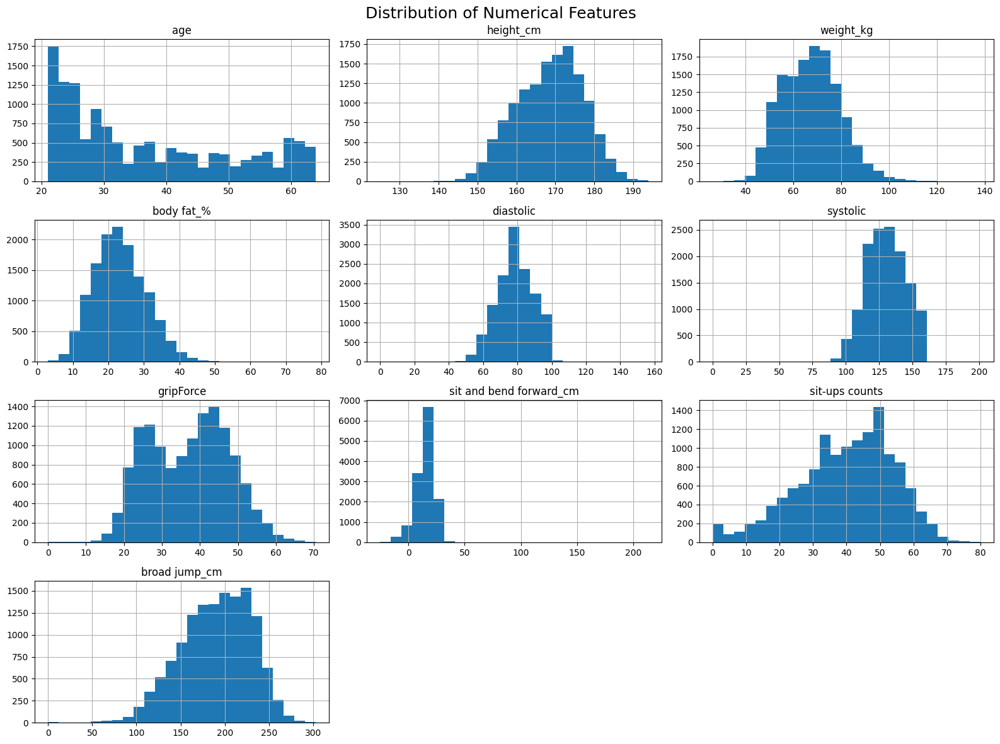

In [21]:
#Matplotlib histograms for all numerical columns
df[numerical_columns].hist(figsize=(16,12), bins=25) #Histograms provide an overview of the shape and spread of each numerical
plt.suptitle("Distribution of Numerical Features", fontsize=18)  #variable, helping identify skewness, clustering and unusual distributions
plt.tight_layout()
plt.show()

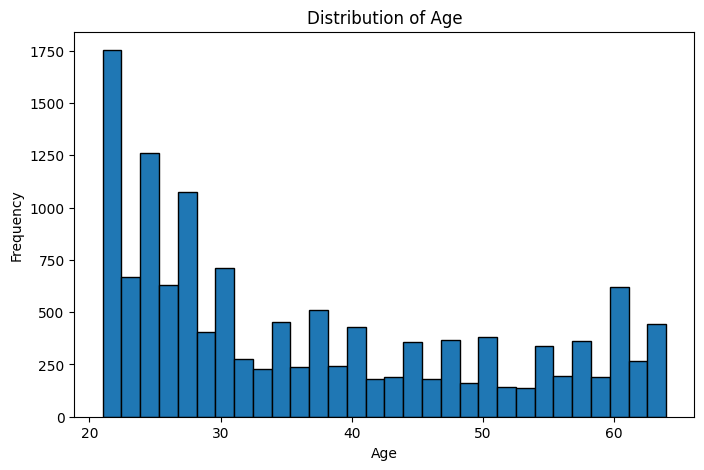

In [22]:
#Matplotlib histogram for age
plt.figure(figsize=(8,5))
plt.hist(df["age"], bins=30, edgecolor="black")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.title("Distribution of Age")
plt.show()

In [23]:
#Plotly version : age distribution by gender
fig = px.histogram( #Plotly histograms allow interactive comparison between categories such as gender and performance class
    df,             #making distribution differences easier to explore
    x="age",
    color="gender",
    nbins=30,
    title="Interactive Distribution of Age by Gender"
)
fig.show()

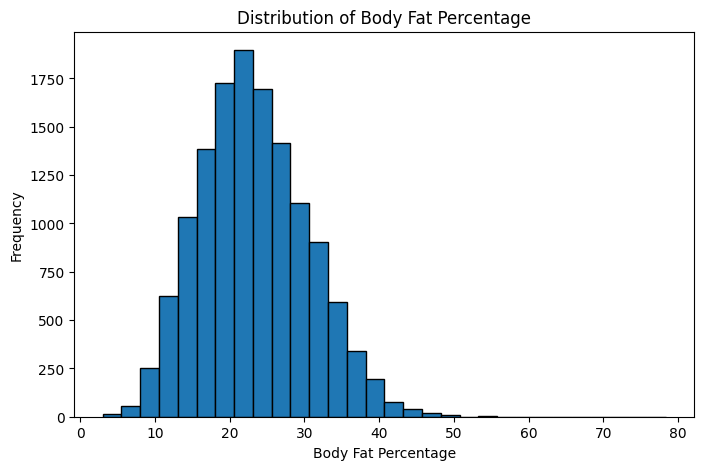

In [24]:
#Matplotlib histogram for body fat percentage
plt.figure(figsize=(8,5))
plt.hist(df["body fat_%"], bins=30, edgecolor="black")
plt.xlabel("Body Fat Percentage")
plt.ylabel("Frequency")
plt.title("Distribution of Body Fat Percentage")
plt.show()

In [25]:
#Plotly version : body fat distribution by class
fig = px.histogram(
    df,
    "body fat_%",
    color="class",
    nbins=30,
    title="Interactive Distribution of Body Fat Percentage by Performance Class"
)
fig.show()

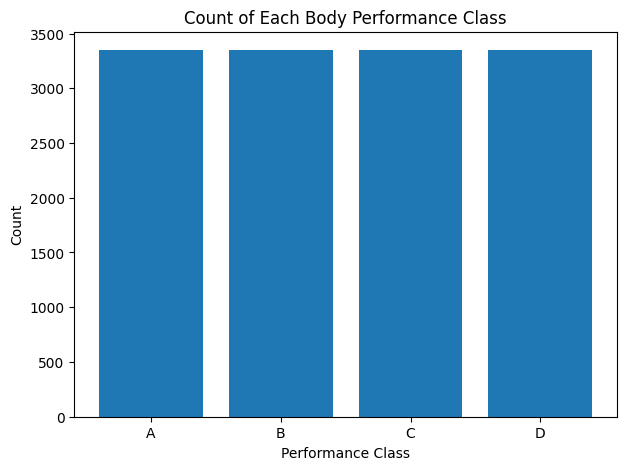

In [26]:
#Matplotlib bar chart for class distribution
class_counts = df["class"].value_counts().sort_index()
plt.figure(figsize=(7,5))
plt.bar(class_counts.index,class_counts.values)
plt.xlabel("Performance Class")
plt.ylabel("Count")
plt.title("Count of Each Body Performance Class")
plt.show()

In [27]:
#Plotly version : class distribution
fig = px.bar(
    x=class_counts.index,
    y=class_counts.values,
    labels={"x": "Performance Class", "y": "Count"},
    title="Interactive Count of Each Performance Class"
)
fig.show()

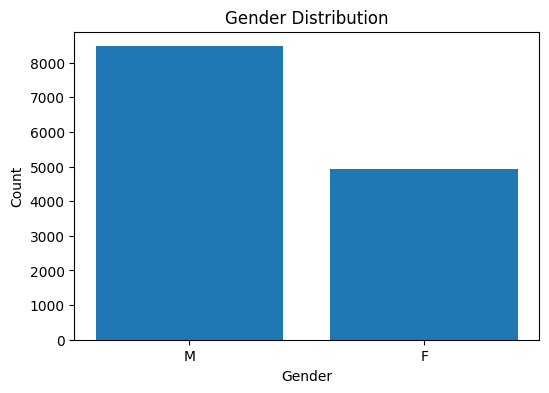

In [28]:
#Matplotlib bar chart for gender distribution 
gender_counts = df["gender"].value_counts()
plt.figure(figsize=(6,4))
plt.bar(gender_counts.index, gender_counts.values)
plt.xlabel("Gender")
plt.ylabel("Count")
plt.title("Gender Distribution")
plt.show()

In [29]:
#Plotly version : gender distribution
fig = px.bar(
    x=gender_counts.index,
    y=gender_counts.values,
    labels={"x": "Gender", "y": "Count"},
    title="Interactive Gender Distribution"
)
fig.show()

Outlier Analysis

Outlier analysis was carried out using both boxplots and the Interquartile Range (IQR) method.

Boxplots visually highlighted variables containing unusually high or low observations, while the IQR method quantified how many values fell outside the typical lower and upper bounds.

Although several variables contained outliers, these values were retained because they are likely to represent genuine variations in human athletic performance rather than data entry errors. Removing these observations could reduce the representativeness of the dataset and potentially eliminate meaningful extreme performers.

The presence of outliers is expected in real-world physical performance datasets because individuals can vary substantially in strength, flexibility and endurance.

The outlier analysis also reinforced the importance of standardisation before PCA and clustering, since variables with large ranges or extreme values can disproportionately influence distance-based methods.

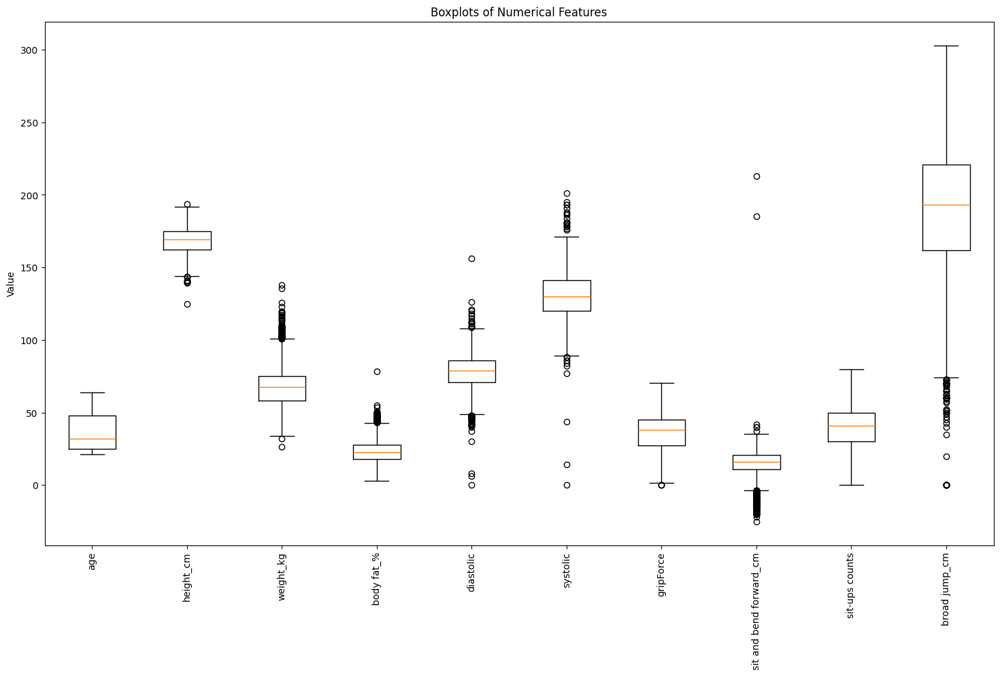

In [30]:
#Matplotlib boxplots for all numerical columns
plt.figure(figsize=(18,10)) #Boxplots are used to visually identify potential outliers and compare
plt.boxplot(                #the spread of variables across the dataset
    [df[col].dropna() for col in numerical_columns],
    labels=numerical_columns,
    vert=True
)
plt.xticks(rotation=90)
plt.ylabel("Value")
plt.title("Boxplots of Numerical Features")
plt.show()

In [31]:
#IQR-based outlier count
Q1 = df[numerical_columns].quantile(0.25)
Q3 = df[numerical_columns].quantile(0.75)
IQR = Q3 - Q1  #The Interquartile Range (IQR) measures the spread of the middle 50%
outliers = ((df[numerical_columns] < (Q1 - 1.5 * IQR)) |  #of observations and is commonly used for outlier detection
            (df[numerical_columns] > (Q3 + 1.5 * IQR))).sum() #Observations outside 1.5 x IQR are treated as potential outliers,
outliers.sort_values(ascending=False)                         #allowing unusually extreme values to be quantified numerically

sit and bend forward_cm    409
weight_kg                   83
body fat_%                  77
broad jump_cm               57
diastolic                   54
systolic                    28
height_cm                   10
gripForce                    3
age                          0
sit-ups counts               0
dtype: int64

In [32]:
#Plotly boxplot : body fat percentage by class
fig = px.box(
    df,
    x="class",
    y="body fat_%",
    title="Interactive Boxplot of Body Fat Percentage by Performance Class"
)
fig.show()

In [33]:
#Plotly boxplot : sit-ups by class
fig = px.box(
    df,
    x="class",
    y="sit-ups counts",
    title="Interactive Boxplot of Sit-ups Count by Performance Class"
)
fig.show()

Relationships Between Variables

Scatter plots and grouped boxplots were used to investigate relationships between pairs of variables.
Several meaningful relationships were observed:
1)Height and weight displayed a strong positive relationship
2)Higher body fat percentages were generally associated with lower sit-up counts
3)Stronger sit-up performance tended to coincide with greater broad jump distances

These findings suggest that body composition and muscular endurance may strongly influence overall physical performance.
The use of both Matplotlib and Plotly provided complementary perspectives:
1)Matplotlib offered clear static comparisons
2)Plotly enabled interactive exploration with hover-based inspection of individual observations

Class-based comparisons were particularly insightful. Individuals in higher performance classes generally demonstrated:
1)Lower body fat percentages
2)Greater muscular endurance
3)Stronger explosive power

The scatter matrix further demonstrated that many of the numerical variables are interrelated, supporting the later use of PCA for dimensionality reduction.


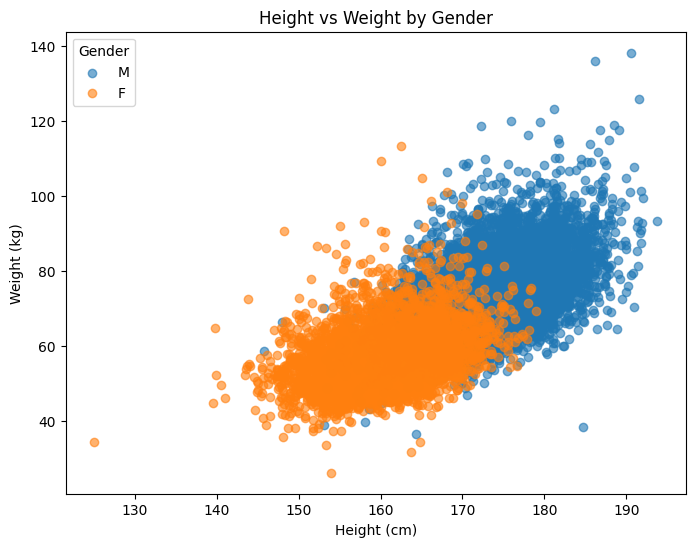

In [34]:
#Matplotlib scatter plot : height vs weight by gender
plt.figure(figsize=(8, 6))

for gender in df["gender"].unique():
    subset = df[df["gender"] == gender]
    plt.scatter(                      #Scatter plots help investigate relationships between pairs of variables
        subset["height_cm"],          #and reveal whether variables display positive, negative or weak associations
        subset["weight_kg"],
        label=gender,
        alpha=0.6
    )

plt.xlabel("Height (cm)")
plt.ylabel("Weight (kg)")
plt.title("Height vs Weight by Gender")
plt.legend(title="Gender")

plt.show()

In [35]:
#Plotly version : height vs weight
fig = px.scatter( #Interactive Plotly scatter plots allow deeper exploration of relationships
    df,           #through hover information and category-based colouring
    x="height_cm",
    y="weight_kg",
    color="gender",
    hover_data=["age", "class"],
    title="Interactive Plot: Height vs Weight by Gender",
    render_mode="svg"
)

fig.show()

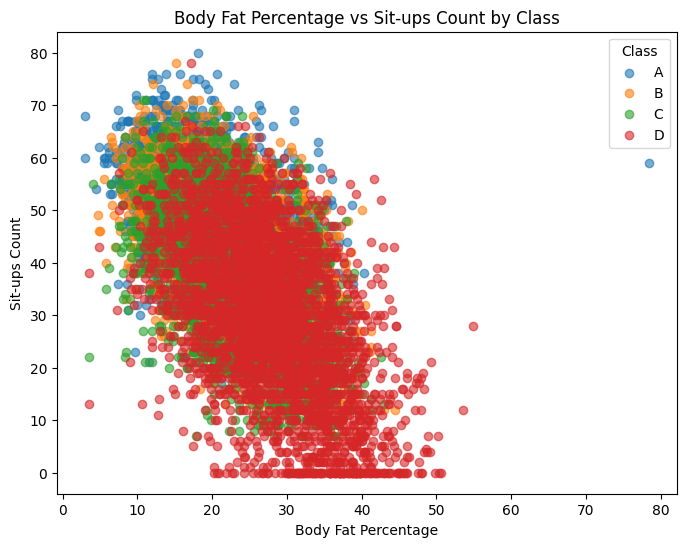

In [36]:
#Matplotlib scatter plot : body fat percentage vs sit-ups by class
plt.figure(figsize=(8, 6))

for performance_class in sorted(df["class"].unique()):
    subset = df[df["class"] == performance_class]
    plt.scatter(
        subset["body fat_%"],
        subset["sit-ups counts"],
        label=performance_class,
        alpha=0.6
    )

plt.xlabel("Body Fat Percentage")
plt.ylabel("Sit-ups Count")
plt.title("Body Fat Percentage vs Sit-ups Count by Class")
plt.legend(title="Class")

plt.show()

In [37]:
#Plotly version : body fat percentage
fig = px.scatter(
    df,
    x="body fat_%",
    y="sit-ups counts",
    color="class",
    hover_data=["age", "gender"],
    title="Interactive Plot: Body Fat Percentage vs Sit-ups Count",
    render_mode="svg"
)

fig.show()

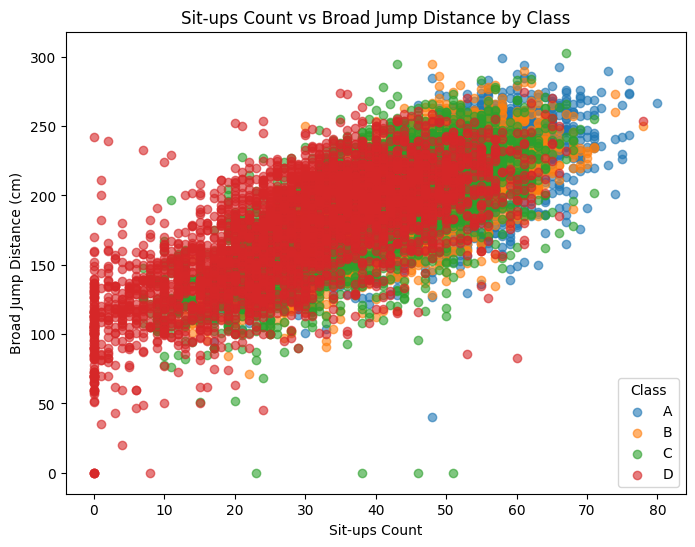

In [38]:
#Matplotlib scatter plot : sit-ups vs broad jump by class
plt.figure(figsize=(8, 6))

for performance_class in sorted(df["class"].unique()):
    subset = df[df["class"] == performance_class]
    plt.scatter(
        subset["sit-ups counts"],
        subset["broad jump_cm"],
        label=performance_class,
        alpha=0.6
    )

plt.xlabel("Sit-ups Count")
plt.ylabel("Broad Jump Distance (cm)")
plt.title("Sit-ups Count vs Broad Jump Distance by Class")
plt.legend(title="Class")

plt.show()


In [39]:
#Plotly version : sit-ups vs broad jump
fig = px.scatter(
    df,
    x="sit-ups counts",
    y="broad jump_cm",
    color="class",
    hover_data=["age", "gender"],
    title="Interactive Plot: Sit-ups Count vs Broad Jump Distance",
    render_mode="svg"
)

fig.show()
    

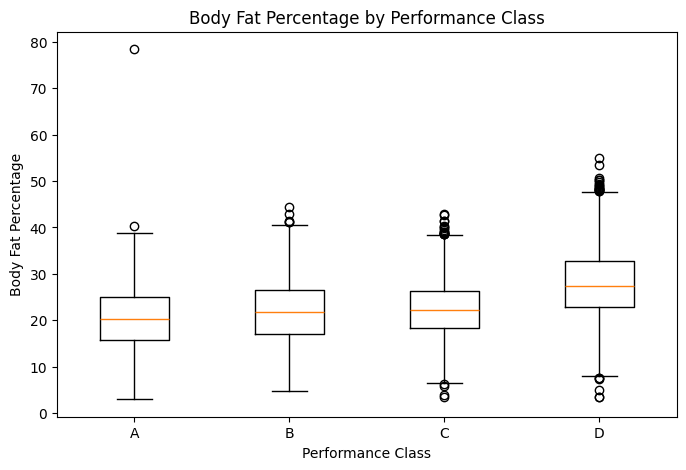

In [40]:
#Matplotlib boxplot : body fat percentage by class
classes = sorted(df["class"].unique())

body_fat_by_class = [df[df["class"] == c]["body fat_%"] for c in classes]

plt.figure(figsize=(8, 5))

plt.boxplot(body_fat_by_class, labels=classes)

plt.xlabel("Performance Class")
plt.ylabel("Body Fat Percentage")
plt.title("Body Fat Percentage by Performance Class")

plt.show()

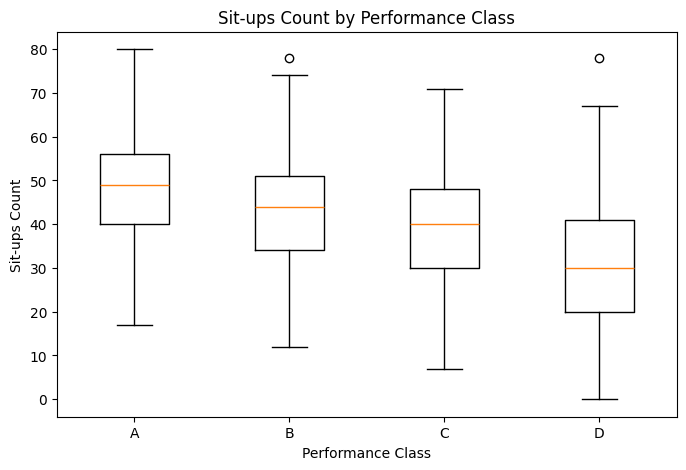

In [41]:
#Matplotlib boxplot : sit-ups count by class
situps_by_class = [df[df["class"] == c]["sit-ups counts"] for c in classes]

plt.figure(figsize=(8, 5))

plt.boxplot(situps_by_class, labels=classes)

plt.xlabel("Performance Class")
plt.ylabel("Sit-ups Count")
plt.title("Sit-ups Count by Performance Class")

plt.show()

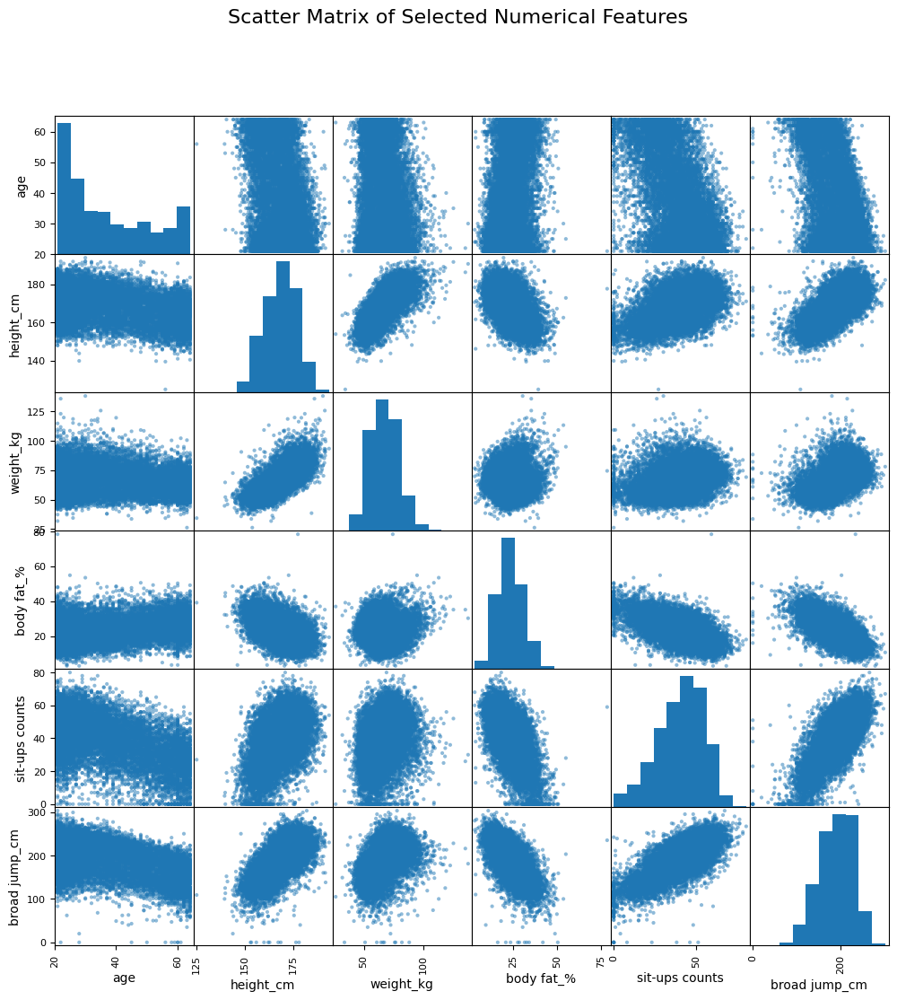

In [42]:
#Scatter matrix for selected numerical features using Matplotlib
selected_features = [ #The scatter matrix enables simultaneous comparison of multiple numerical
    "age",            #variables, helping identify broader multivariate relationships
    "height_cm",
    "weight_kg",
    "body fat_%",
    "sit-ups counts",
    "broad jump_cm"
]

scatter_matrix(
    df[selected_features],
    figsize=(12, 12),
    diagonal="hist",
    alpha=0.5
)

plt.suptitle("Scatter Matrix of Selected Numerical Features", fontsize=16)
plt.show()

In [43]:
#Plotly scatter matrix for selected features
fig = px.scatter_matrix(
    df,
    dimensions=selected_features,
    color="class",
    title="Interactive Scatter Matrix of Selected Features"
)

fig.show()

Correlation Analysis

Correlation analysis was used to measure the strength and direction of linear relationships between numerical variables.
The correlation heatmap revealed several important patterns:
1)Body fat percentage showed negative correlations with performance-related variables
2)sit-up counts and broad jump distance displayed positive relationships 
3)Weight and BMI were strongly positively correlated

These relationships align with intuitive expectations regarding physical fitness and exercise capability.

The interactive Plotly heatmap was particularly useful because it allowed precise examination of individual correlation coefficients.

Correlation analysis also helped identify variables that may contribute strongly to the principal components later extracted during PCA.

In [44]:
#Correlation matrix
correlation_matrix = df[numerical_columns].corr() #Correlation analysis measures the strength and direction of linear
correlation_matrix                                #relationships between numerical variables

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
age,1.000000,-0.294080,-0.100059,0.242372,0.158471,0.211082,-0.179638,-0.070007,-0.544562,-0.435217
height_cm,-0.294080,1.000000,0.734868,-0.515392,0.145863,0.209963,0.735007,-0.221933,0.500551,0.674586
weight_kg,-0.100059,0.734868,1.000000,-0.083958,0.262252,0.338743,0.700100,-0.296217,0.295022,0.479546
body fat_%,0.242372,-0.515392,-0.083958,1.000000,0.048125,-0.030157,-0.541758,-0.071269,-0.609010,-0.673264
diastolic,0.158471,0.145863,0.262252,0.048125,1.000000,0.676370,0.202020,-0.072068,0.016596,0.097211
systolic,0.211082,0.209963,0.338743,-0.030157,0.676370,1.000000,0.285921,-0.082344,0.056473,0.152817
gripForce,-0.179638,0.735007,0.700100,-0.541758,0.202020,0.285921,1.000000,-0.112546,0.576750,0.746846
sit and bend forward_cm,-0.070007,-0.221933,-0.296217,-0.071269,-0.072068,-0.082344,-0.112546,1.000000,0.177128,0.026511
sit-ups counts,-0.544562,0.500551,0.295022,-0.609010,0.016596,0.056473,0.576750,0.177128,1.000000,0.748334
broad jump_cm,-0.435217,0.674586,0.479546,-0.673264,0.097211,0.152817,0.746846,0.026511,0.748334,1.000000


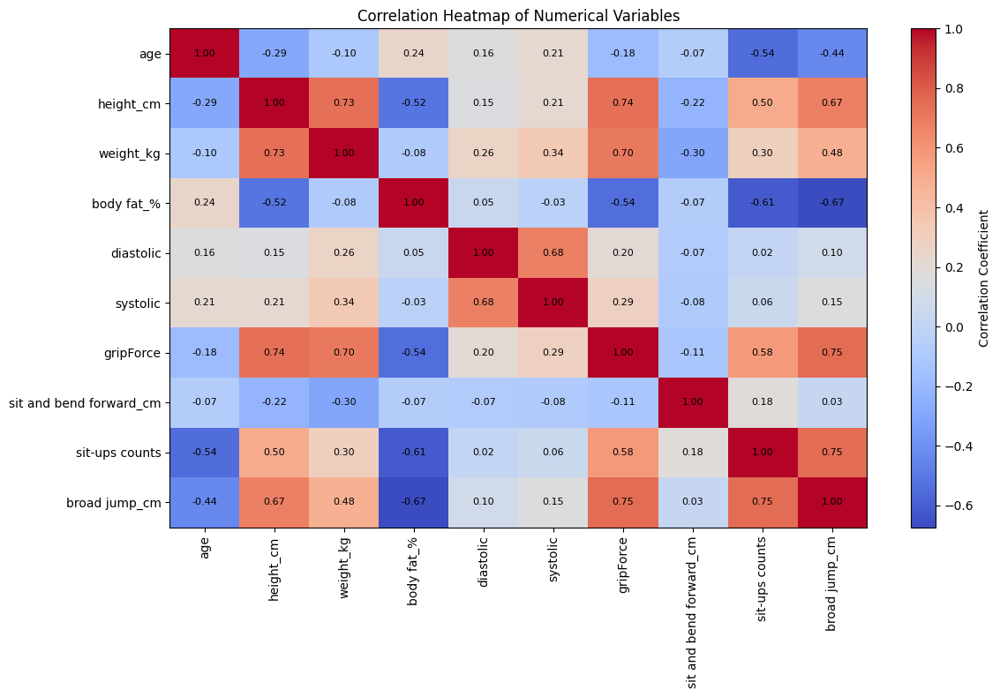

In [45]:
#Matplotlib Correlation heatmap
plt.figure(figsize=(12, 8))

plt.imshow(correlation_matrix, cmap="coolwarm", aspect="auto")  #The heatmap provides a visual summary of correlations, making strong
plt.colorbar(label="Correlation Coefficient")                   #positive and negative relationships easier to identify

plt.xticks(
    range(len(correlation_matrix.columns)),
    correlation_matrix.columns,
    rotation=90
)

plt.yticks(
    range(len(correlation_matrix.columns)),
    correlation_matrix.columns
)

for i in range(len(correlation_matrix.columns)):
    for j in range(len(correlation_matrix.columns)):
        plt.text(
            j,
            i,
            f"{correlation_matrix.iloc[i, j]:.2f}",
            ha="center",
            va="center",
            fontsize=8
        )

plt.title("Correlation Heatmap of Numerical Variables")
plt.tight_layout()
plt.show()


In [46]:
#Plotly interactive correlation map
fig = px.imshow(
    correlation_matrix,
    text_auto=".2f",
    title="Interactive Correlation Heatmap"
)

fig.show()

In [47]:
#Correlation with body fat percentage
correlation_matrix["body fat_%"].sort_values(ascending=False)

body fat_%                 1.000000
age                        0.242372
diastolic                  0.048125
systolic                  -0.030157
sit and bend forward_cm   -0.071269
weight_kg                 -0.083958
height_cm                 -0.515392
gripForce                 -0.541758
sit-ups counts            -0.609010
broad jump_cm             -0.673264
Name: body fat_%, dtype: float64

In [48]:
#Correlation with sit-ups count
correlation_matrix["sit-ups counts"].sort_values(ascending=False)

sit-ups counts             1.000000
broad jump_cm              0.748334
gripForce                  0.576750
height_cm                  0.500551
weight_kg                  0.295022
sit and bend forward_cm    0.177128
systolic                   0.056473
diastolic                  0.016596
age                       -0.544562
body fat_%                -0.609010
Name: sit-ups counts, dtype: float64

Interactive Visualisation with Plotly

In [49]:
#Interactive scatter plot
fig = px.scatter(
    df,
    x="weight_kg",
    y="body fat_%",
    color="class",
    hover_data=["age","gender"],
    title="Interactive Plot: Weight vs Body Fat Percentage",
    render_mode="svg"
)
fig.show()
                 

In [50]:
#Interactive scatter plot of performance variables
fig = px.scatter(
    df,
    x="sit-ups counts",
    y="broad jump_cm",
    color="class",
    hover_data=["age", "gender"],
    title="Interactive Plot: Sit-ups Count vs Broad Jump Distance",
    render_mode="svg"
)
fig.show()

Feature Engineering

Feature engineering was performed to enrich the dataset and create more meaningful derived variables.

A Body Mass Index(BMI) feature was created using height and weight measurements. BMI is widely used as an indicator of body composition and provides additional context beyond weight alone.

Categorical variables were also encoded numerically to prepare the data for PCA and clustering:
1)Gender was encoded as a binary variable
2)Performance class was encoded separately for later interpretation

Importantly, the encoded class variable was excluded from PCA to ensure that the dimensionality reduction process identified structure naturally from the physical measurements rather than from the target labels themselves.

The engineered BMI feature showed strong relationships with weight and body fat percentage, indicating that it provides meaningful additional information.

In [51]:
#Creating a copy of the dataset for encoded analysis
df_encoded=df.copy()

In [52]:
#Encoding gender
df_encoded["gender"] = df_encoded["gender"].map({"M":0, "F": 1}) #Gender is encoded numerically so it can later be used in PCA,
df_encoded.head()                                                #clustering and correlation analysis

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,0,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,0,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,0,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,0,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,0,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B


In [53]:
#Encoding class as an ordered variable
class_mapping = {
    "A":4,
    "B":3,
    "C":2,
    "D":1
}
df_encoded["class_encoded"] = df_encoded["class"].map(class_mapping) #Performance classes are encoded into ordered numerical values
df_encoded.head()                                                    #to support later interpretation and comparison

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class,class_encoded
0,27.0,0,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C,2
1,25.0,0,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A,4
2,31.0,0,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C,2
3,32.0,0,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B,3
4,28.0,0,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B,3


In [54]:
#Creating BMI feature
df_encoded["BMI"] = df_encoded["weight_kg"]/((df_encoded["height_cm"]/100)**2) #BMI is engineered from height and weight to provide
df_encoded[["height_cm", "weight_kg", "BMI"]].head()                           #an additional indicator of body composition beyond raw weight alone

,height_cm,weight_kg,BMI
0,172.3,75.24,25.344179
1,165.0,55.80,20.495868
2,179.6,78.00,24.181428
3,174.5,71.10,23.349562
4,173.8,67.70,22.412439


In [55]:
#Checking correlation with the engineered BMI feature
df_encoded.select_dtypes(include=np.number).corr()["BMI"].sort_values(ascending=False)

BMI                        1.000000
weight_kg                  0.836636
gripForce                  0.415521
systolic                   0.321011
body fat_%                 0.288551
diastolic                  0.261109
height_cm                  0.250280
broad jump_cm              0.151631
age                        0.098646
sit-ups counts             0.022778
sit and bend forward_cm   -0.249436
class_encoded             -0.275061
gender                    -0.389438
Name: BMI, dtype: float64

Principal Component Analysis (PCA)

PCA was performed to reduce the dimensionality of the dataset while preserving as much variance as possible.

Before PCA was applied, the numerical features were standardised using StandardScaler. This preprocessing step is essential because PCA is sensitive to scale. Without standardisation, variables with larger numerical ranges would dominate the principal components.

The scree plot showed how much cumulative variance was explained as additional principal components were included. The first few principal components captured a substantial proportion of total variance, indicating that the dataset contains strong underlying structure.

Visualising the first two principal components revealed partial separation between performance classes. Although the classes were not perfectly separable, higher-performing groups tended to occupy different regions of the PCA projection compared with lower-performing groups.

This suggests that the physical and performance variables contain meaningful multidimensional patterns.

The PCA loading analysis provided additional insight into which original variables contributed most strongly to the principal components. Variables related to body composition and exercise performance showed strong influence, indicating that these factors drive much of the variation within the dataset.

The 3D visualisation and parallel coordinates plot further strengthened the analysis by allowing multiple performance variables to be explored simultaneously.

In [56]:
#selecting features for PCA
pca_features = df_encoded.drop(columns=["class", "class_encoded"])
pca_features = pca_features.select_dtypes(include=np.number)
pca_features.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,BMI
0,27.0,0,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,25.344179
1,25.0,0,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,20.495868
2,31.0,0,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,24.181428
3,32.0,0,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,23.349562
4,28.0,0,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,22.412439


In [57]:
#Standardising the data before PCA
scaler = StandardScaler() #Standardisation is essential before PCA because variables with larger 
scaled_data = scaler.fit_transform(pca_features) #scales would otherwise dominate the principal components

In [58]:
#Applying PCA
pca = PCA() #PCA reduces dimensionality by transforming the original variables into 
            #orthogonal principal components that capture maximum variance
X_pca = pca.fit_transform(scaled_data) #Features are transformed to have mean=0 and standard deviation 1,
                                       #ensuring all variables contribute fairly to PCA and clustering

In [59]:
#Explained variance ratio
explained_variance = pca.explained_variance_ratio_ #The explained variance ratio indicates how much information each
explained_variance                                 #principal component preserves from the original dataset

array([4.20083869e-01, 2.05400728e-01, 1.10654724e-01, 8.38995961e-02,
       6.33423633e-02, 3.19330905e-02, 2.59739127e-02, 1.83464659e-02,
       1.48419319e-02, 1.38548424e-02, 1.14274299e-02, 2.41045968e-04])

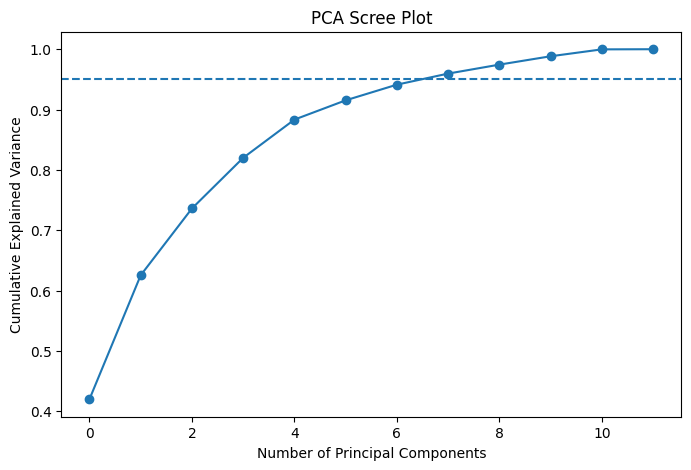

In [60]:
#Matplotlib Scree plot
plt.figure(figsize=(8, 5))

plt.plot(np.cumsum(explained_variance), marker="o") #The scree plot shows how cumulative explained variance increases as
plt.axhline(y=0.95, linestyle="--")                 #additional principal components are included

plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Scree Plot")

plt.show()

In [61]:
#PCA with two components
pca_2 = PCA(n_components=2)
principal_components = pca_2.fit_transform(scaled_data)
pca_df = pd.DataFrame(
    data=principal_components,
    columns=["PC1","PC2"]
)
pca_df["class"] = df["class"].values
pca_df["gender"] = df["gender"].values
pca_df.head()

,PC1,PC2,class,gender
0,2.334256,-0.524301,C,M
1,0.543775,-2.059986,A,M
2,2.148943,0.953346,C,M
3,1.764138,-0.415126,B,M
4,1.144417,-1.653711,B,M


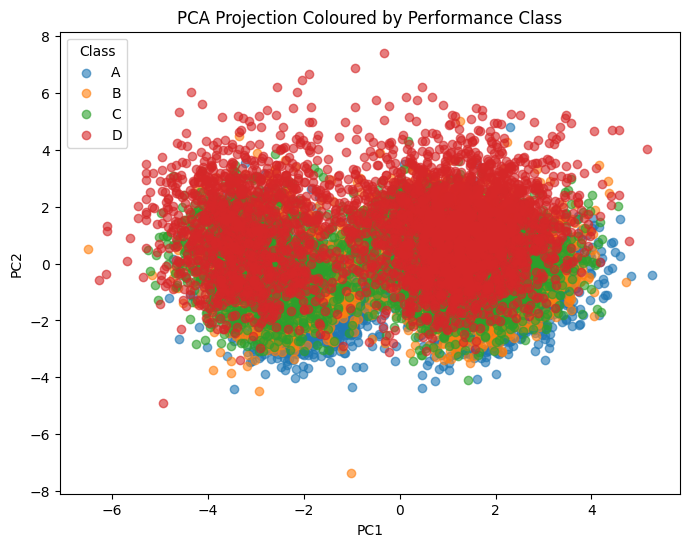

In [62]:
#Matplotlib PCA scatter plot coloured by class
plt.figure(figsize=(8, 6))

for performance_class in sorted(pca_df["class"].unique()):
    subset = pca_df[pca_df["class"] == performance_class]
    plt.scatter(
        subset["PC1"],
        subset["PC2"],
        label=performance_class,
        alpha=0.6
    )

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA Projection Coloured by Performance Class")
plt.legend(title="Class")

plt.show()

In [63]:
#Plotly PCA scatter plot coloured by class
fig = px.scatter(
    pca_df,
    x="PC1",
    y="PC2",
    color="class",
    hover_data=["gender"],
    title="Interactive PCA Projection Coloured by Class",
    render_mode="svg"
)

fig.show()

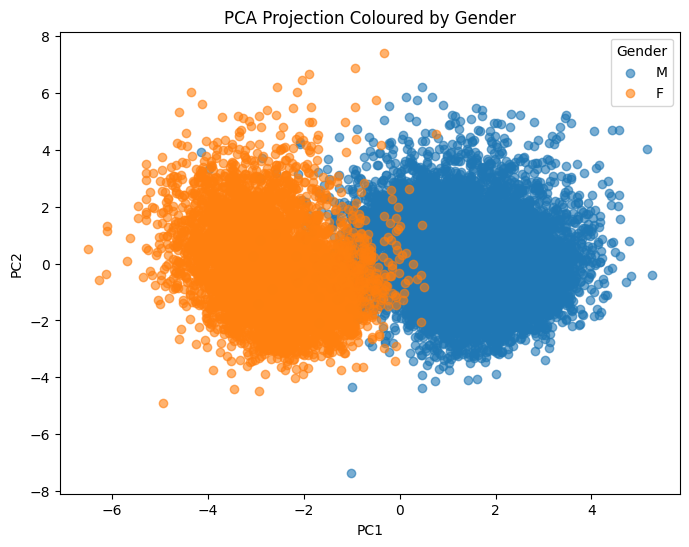

In [64]:
#Matplotlib PCA scatter plot coloured by gender
plt.figure(figsize=(8, 6))

for gender in pca_df["gender"].unique():
    subset = pca_df[pca_df["gender"] == gender]
    plt.scatter(
        subset["PC1"],
        subset["PC2"],
        label=gender,
        alpha=0.6
    )

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA Projection Coloured by Gender")
plt.legend(title="Gender")

plt.show()

In [65]:
#Plotly PCA scatter plot coloured by gender
fig = px.scatter(
    pca_df,
    x="PC1",
    y="PC2",
    color="gender",
    hover_data=["class"],
    title="Interactive PCA Projection Coloured by Gender",
    render_mode="svg"
)

fig.show()

Advanced Visual Exploration

Advanced interactive visualisations were included to explore complex multivariate relationships that are more difficult to identify using traditional two-dimensional plots.

The 3D Plotly scatter plot enabled simultaneous exploration of:
1)Body fat percentage
2)sit-up performance
3)Broad jump distance

The visualisation showed that higher-performing classes generally clustered around:
1)lower body fat percentages
2)higher sit-up counts
3)Larger broad jump distances

The parallel coordinates plot was particularly useful because it allowed multiple variables to be compared across individuals simultaneously. The visualisation highlighted how performance classes differ across combinations of body composition and exercise capability rather than isolated variables.

These richer visualisations helped uncover patterns that would be difficult to identify using summary statistics alone.

In [66]:
#3D interactive scatter plot of performance-related variables
fig = px.scatter_3d( #The 3D visualisation enables simultaneous exploration of multiple
    df,              #performance-related variables and class separation
    x="body fat_%",
    y="sit-ups counts",
    z="broad jump_cm",
    color="class",
    hover_data=["age", "gender", "weight_kg"],
    title="3D visualisation of Body Fat, Sit-ups and Broad Jump by Class"
)
fig.show()

In [67]:
#Preparing data for parallel coordinates plot
parallel_df = df_encoded.copy()
parallel_features = [
    "age",
    "body fat_%",
    "sit-ups counts",
    "broad jump_cm",
    "BMI",
    "class_encoded"
]

fig = px.parallel_coordinates(  #Parallel coordinates plots allow multiple numerical variables to be 
    parallel_df[parallel_features],  #compared simultaneously across individuals and performance classes
    color="class_encoded",
    labels={
        "age": "Age",
        "body fat_%": "Body Fat %",
        "sit-ups counts": "Sit-ups",
        "broad jump_cm": "Broad Jump",
        "BMI": "BMI",
        "class_encoded": "Class"
    },
    title="Parallel Coordinates Plot of Key Body Performance Features"
)
fig.show()

In [68]:
#PCA loadings show how strongly each original feature contributes to PC1 and PC2
loadings = pd.DataFrame( #PCA loadings indicate how strongly each original feature contributes to the principal components
    pca_2.components_.T,
    columns=["PC1", "PC2"],
    index=pca_features.columns
)
loadings

,PC1,PC2
age,-0.139136,0.357014
gender,-0.393216,-0.070386
height_cm,0.382892,-0.026347
weight_kg,0.349285,0.286407
body fat_%,-0.266034,0.358629
diastolic,0.121572,0.348562
systolic,0.160147,0.358784
gripForce,0.403615,0.008146
sit and bend forward_cm,-0.084176,-0.258869
sit-ups counts,0.306126,-0.324517


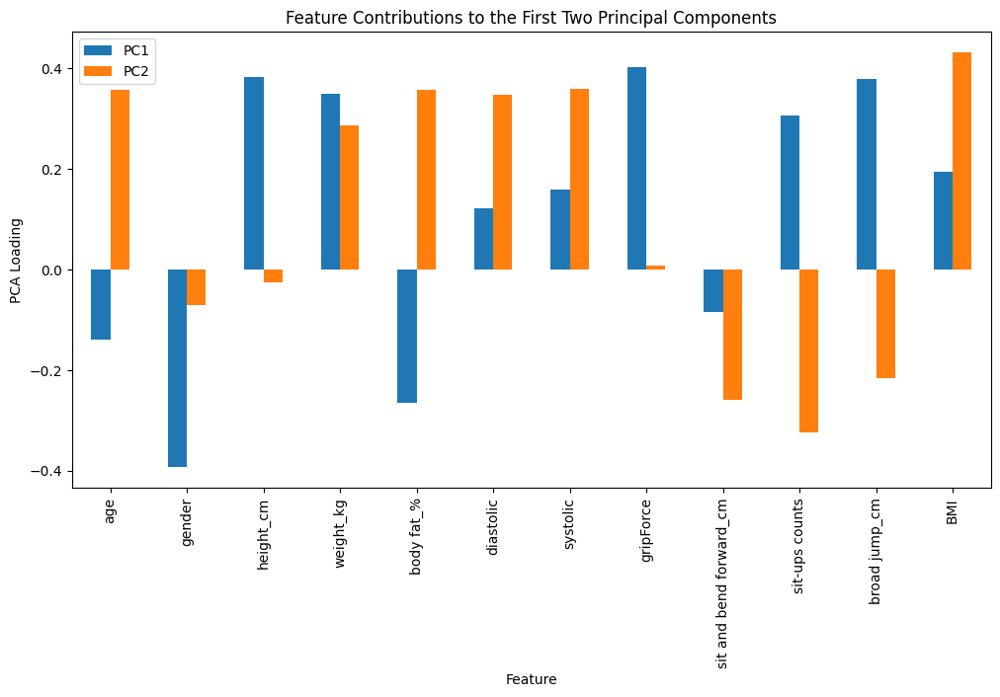

In [69]:
#Visualising PCA loadings for PC1 and PC2
loadings.plot(
    kind="bar",
    figsize=(12,6)
)
plt.title("Feature Contributions to the First Two Principal Components")
plt.ylabel("PCA Loading")
plt.xlabel("Feature")
plt.xticks(rotation=90)
plt.show()


In [70]:
#Interactive version of PCA loadings
loadings_reset = loadings.reset_index().rename(columns={"index": "Feature"})
fig = px.bar(
    loadings_reset,
    x="Feature",
    y=["PC1","PC2"],
    barmode="group",
    title="Interactive PCA Loadings for PC1 and PC2"
)
fig.show()

Clustering Analysis

KMeans clustering was used to investigate whether the dataset naturally contains groups of individuals with similar physical and performance characteristics.

Before clustering, the elbow method was applied to estimate an appropriate number of clusters. The elbow curve suggested diminishing returns after a certain number of clusters, supporting the final cluster choice.

The clusters were visualised using the PCA projection, allowing the high-dimensional groupings to be represented in two dimensions.

Cluster profiling revealed meaningful differences between the groups. Certain clusters were characterised by:
1)Lower body fat percentages
2)higher sit-up counts
3)Lower BMI values

Other clusters showed the opposite pattern.

These findings suggest that the clustering algorithm successfully identified groups corresponding to different physical and fitness profiles.

Importantly, the clusters were generated without directly using the performance class labels, meaning that the algorithm independently uncovered meaningful structure within the data.

In [71]:
#Elbow method for choosing number of clusters
inertias = []
K = range(1, 11)
for k in K:
    kmeans = KMeans(n_clusters = k, random_state=42, n_init=10)  #KMeans clustering groups observations with similar characteristics
    kmeans.fit(scaled_data)                                      #based on distance in the multidimensional feature space
    inertias.append(kmeans.inertia_)                             #Inertia measures within-cluster variation and is used in the elbow
                                                                 #method to estimate an appropriate number of clusters

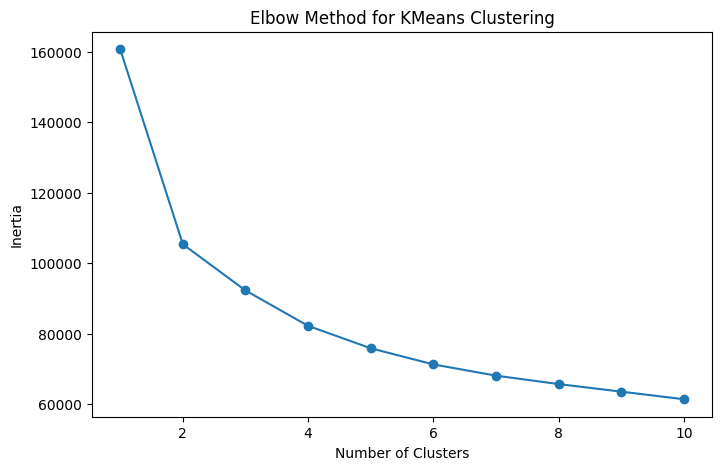

In [72]:
#Matplotlib elbow curve
plt.figure(figsize=(8, 5))

plt.plot(K, inertias, marker="o")

plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.title("Elbow Method for KMeans Clustering")

plt.show()

In [73]:
#Plotly elbow curve
fig = px.line(
    x=list(K),
    y=inertias,
    markers=True,
    labels={"x": "Number of Clusters", "y": "Inertia"},
    title="Interactive Elbow Method for KMeans Clustering"
)

fig.show()

In [74]:
#Applying KMeans clustering
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10) #Each observation is assigned to the nearest cluster centroid,
clusters = kmeans.fit_predict(scaled_data)                #creating groups of individuals with similar physical profiles
pca_df["Cluster"] = clusters
pca_df.head()

,PC1,PC2,class,gender,Cluster
0,2.334256,-0.524301,C,M,3
1,0.543775,-2.059986,A,M,3
2,2.148943,0.953346,C,M,0
3,1.764138,-0.415126,B,M,3
4,1.144417,-1.653711,B,M,3


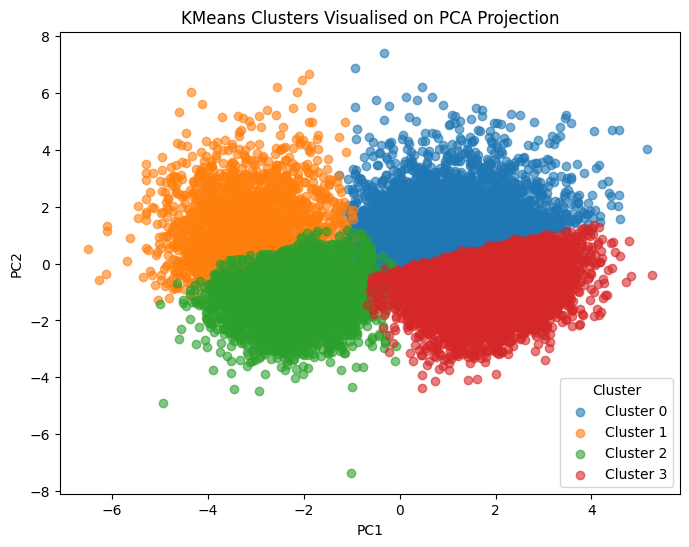

In [75]:
#Visualising clusters using PCA components with Matplotlib
plt.figure(figsize=(8, 6))

for cluster in sorted(pca_df["Cluster"].unique()):
    subset = pca_df[pca_df["Cluster"] == cluster]
    plt.scatter(
        subset["PC1"],
        subset["PC2"],
        label=f"Cluster {cluster}",
        alpha=0.6
    )

plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("KMeans Clusters Visualised on PCA Projection")
plt.legend(title="Cluster")

plt.show()

In [76]:
#Plotly cluster visualisation using PCA components
fig = px.scatter(
    pca_df,
    x="PC1",
    y="PC2",
    color=pca_df["Cluster"].astype(str),
    hover_data=["class", "gender"],
    title="Interactive KMeans Clusters on PCA Projection",
    render_mode="svg"
)

fig.show()

In [77]:
#Adding cluster labels back to encoded dataframe
df_encoded["Cluster"] = clusters
df_encoded.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class,class_encoded,BMI,Cluster
0,27.0,0,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C,2,25.344179,3
1,25.0,0,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A,4,20.495868,3
2,31.0,0,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C,2,24.181428,0
3,32.0,0,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B,3,23.349562,3
4,28.0,0,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B,3,22.412439,3


In [78]:
#Comparing numerical averages across clusters
cluster_summary = df_encoded.groupby("Cluster").mean(numeric_only=True) #Cluster profiling compares average feature values across clusters
cluster_summary                                                         #helping interpret the characteristics of each discovered group

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class_encoded,BMI
Cluster,,,,,,,,,,,,,
0,44.872198,0.010189,172.046317,76.535852,24.586844,85.926143,140.024163,41.594579,9.902469,36.602911,193.011354,1.981368,25.802834
1,52.248029,0.965318,157.519128,58.914430,32.395410,78.718865,130.829217,24.142144,15.766201,18.660011,130.455596,1.978455,23.721440
2,29.675241,0.978778,162.313666,55.409672,25.813438,73.435756,119.623794,26.887183,20.449913,38.101608,167.181672,2.966881,21.015747
3,29.661812,0.001820,174.318568,71.993105,17.160349,77.247694,129.888329,45.022348,15.384454,51.146440,225.536630,2.766586,23.665417


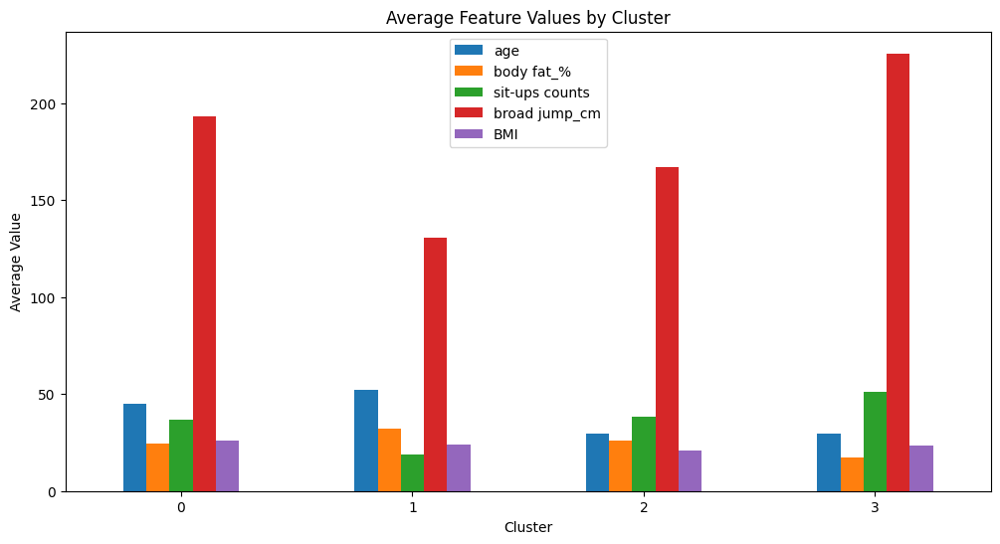

In [79]:
#Visualising average values by cluster with Matplotlib
cluster_summary[
    ["age", "body fat_%", "sit-ups counts", "broad jump_cm", "BMI"]
].plot(
    kind="bar",
    figsize=(12, 6)
)

plt.title("Average Feature Values by Cluster")
plt.ylabel("Average Value")
plt.xlabel("Cluster")
plt.xticks(rotation=0)

plt.show()

In [80]:
#Plotly grouped bar chart for cluster summary
cluster_summary_reset = cluster_summary.reset_index()

fig = px.bar(
    cluster_summary_reset,
    x="Cluster",
    y=["age", "body fat_%", "sit-ups counts", "broad jump_cm", "BMI"],
    barmode="group",
    text_auto=True,
    title="Interactive Comparison of Average Feature Values by Cluster"
)

fig.show()

Key Findings

Several important findings emerged from the analysis:
1)Body fat percentage showed negative relationships with performance-related variables
2)sit-up counts and broad jump distances demonstrated positive associations
3)PCA revealed meaningful multidimensional structure within the dataset
4)Clustering identified distinct groups of individuals with similar physical and performance profiles
5)The engineered BMI feature provided additional insight into body composition

The analysis also demonstrated that higher performance classes generally correspond to:
1)Lower body fat percentages
2)Stronger muscular endurance
3)Improved explosive power

The combination of descriptive statistics, visualisation, PCA and clustering provided a comprehensive understanding of the dataset.

Conclusion

This notebook carried out a detailed EDA of the body performance dataset using techniques covered in lectures 4-12.

The analysis progressed from initial data inspection and descriptive statistics to more advanced techniques such as PCA and KMeans clustering.

The results demonstrated that the dataset contains meaningful relationships between body composition and physical performance variables. Higher-performing individuals generally exhibited lower body fat percentages and stronger exercise performance metrics.

The use of both Matplotlib and Plotly enabled the data to be explored through both static and interactive visualisations, while PCA and clustering helped uncover hidden multidimensional structure.

Overall, the analysis demonstrates how EDA techniques can be used to not only summarise data, but also generate meaningful insights into real-world physical performance patterns.